# 自动语音识别

## 您将学到什么以及将构建什么

在本节中，我们将了解如何使用 Transformer 将口语语音转换为文本，这是一项称为语音识别的任务。

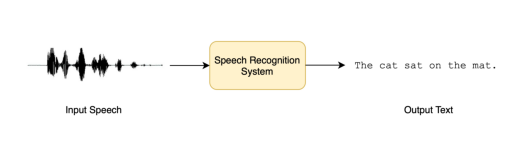

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic = mpimg.imread('images/5.1asr_diagram.png')
pic.shape
plt.imshow(pic)
plt.axis('off') 
plt.show()

语音识别，也称为自动语音识别（ASR）或语音转文本（STT），是最流行和最令人兴奋的口语处理任务之一。它的应用范围很广，包括听写、语音助手、视频字幕和会议转录。

您之前可能已经多次使用过语音识别系统，但没有意识到！考虑智能手机设备中的数字助理（Siri、Google Assistant、Alexa）。当您使用这些助手时，他们做的第一件事是将您的口头讲话转录为书面文本，准备用于任何下游任务（例如为您查找天气🌤️）。

尝试一下下面的语音识别演示。您可以使用麦克风录制自己的声音，也可以拖放音频样本进行转录：

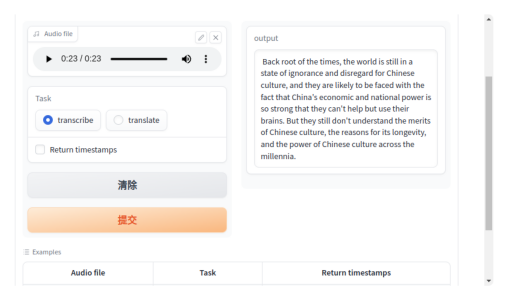

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic = mpimg.imread('images/5.2speechrecognitiondemo.png')
pic.shape
plt.imshow(pic)
plt.axis('off') 
plt.show()

语音识别是一项具有挑战性的任务，因为它需要音频和文本的联合知识。输入音频可能有大量背景噪音，并且由具有不同口音的说话者说出，因此很难辨别出语音。书面文本可能包含没有声音的字符，例如标点符号，仅从音频很难推断出这些字符。这些都是我们在构建有效的语音识别系统时必须克服的障碍！

现在我们已经定义了我们的任务，我们可以开始更详细地研究语音识别。在本单元结束时，您将对可用的不同预训练语音识别模型以及如何将它们与 🤗 Transformers 库一起使用有一个很好的基本了解。您还将了解在所选领域或语言上微调 ASR 模型的过程，从而使您能够为遇到的任何任务构建高性能系统。您将能够通过构建一个现场演示向您的朋友和家人展示您的模型，该演示可以接受任何口头演讲并将其转换为文本！

## 用于语音识别的预训练模型

在本节中，我们将介绍如何使用pipeline()预训练模型进行语音识别。在第 2 单元中，我们介绍了一种pipeline()运行语音识别任务的简单方法，所有预处理和后处理都在后台处理，并且可以灵活地快速试验 Hugging Face Hub 上的任何预训练检查点。在本单元中，我们将更深入地探索语音识别模型的不同属性，以及如何使用它们来解决一系列不同的任务。

如第 3 单元所述，语音识别模型大致分为以下两类之一：

1. 连接主义时间分类 (CTC)：仅编码器模型，顶部有线性分类 (CTC) 头

2. 序列到序列（Seq2Seq）：编码器-解码器模型，编码器和解码器之间具有交叉注意力机制

在 2022 年之前，CTC 是这两种架构中更受欢迎的一种，Wav2Vec2、HuBERT 和 XLSR 等纯编码器模型在语音预训练/微调范例方面取得了突破。Meta 和 Microsoft 等大公司使用大量未标记的音频数据对编码器进行了几天或几周的预训练。然后，用户可以采用预先训练的检查点，并使用 CTC 对短短10 分钟的标记语音数据进行微调，以在下游语音识别任务中实现强大的性能。

然而，CTC 模型也有其缺点。向编码器附加一个简单的线性层可以提供一个小而快速的整体模型，但很容易出现语音拼写错误。我们将在下面的 Wav2Vec2 模型中演示这一点。

### 探索 CTC 模型

让我们加载LibriSpeech ASR数据集的一小段摘录，以演示 Wav2Vec2 的语音转录功能：

In [1]:
from datasets import load_dataset

dataset = load_dataset(
    "hf-internal-testing/librispeech_asr_dummy", "clean", split="validation"
)
dataset

Dataset({
    features: ['file', 'audio', 'text', 'speaker_id', 'chapter_id', 'id'],
    num_rows: 73
})

我们可以选择 73 个音频样本之一并检查音频样本以及转录：

In [2]:
from IPython.display import Audio

sample = dataset[2]

print(sample["text"])
Audio(sample["audio"]["array"], rate=sample["audio"]["sampling_rate"])

HE TELLS US THAT AT THIS FESTIVE SEASON OF THE YEAR WITH CHRISTMAS AND ROAST BEEF LOOMING BEFORE US SIMILES DRAWN FROM EATING AND ITS RESULTS OCCUR MOST READILY TO THE MIND


好吧！圣诞节和烤牛肉，听起来很棒！🎄 选择数据样本后，我们现在将微调的检查点加载到pipeline(). 为此，我们将使用在 100 小时的 LibriSpeech 数据上微调的官方Wav2Vec2 基本检查点：

In [3]:
from transformers import pipeline

pipe = pipeline("automatic-speech-recognition", model="facebook/wav2vec2-base-100h")

Some weights of the model checkpoint at facebook/wav2vec2-base-100h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.mask_time_emb_vector']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-100h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading the tokenizer from the `special_tokens_map.json` and the `added_tokens.json` will be removed in `transformers 5`,  it is kept for forward compatibility, but it is recommended to update your `tokenizer_config.json` by uploading it again. You will see the new `added_tokens_decoder` attribute that will store the relevant information.


接下来，我们将从数据集中获取一个示例，并将其原始数据传递到管道。由于它pipeline 会消耗我们传递给它的任何字典（意味着它不能重复使用），因此我们将传递数据的副本。这样，我们就可以在以下示例中安全地重复使用相同的音频样本：

In [4]:
pipe(sample["audio"].copy())

{'text': 'HE TELLS US THAT AT THIS FESTIVE SEASON OF THE YEAR WITH CHRISTMAUS AND ROSE BEEF LOOMING BEFORE US SIMALYIS DRAWN FROM EATING AND ITS RESULTS OCCUR MOST READILY TO THE MIND'}

将目标文本与预测转录进行比较，我们可以看到所有单词听起来都是正确的，但有些单词拼写不准确。例如：
CHRISTMAUS vs. CHRISTMAS
ROSE vs. ROAST
SIMALYIS vs. SIMILES

这凸显了CTC模型的缺点。CTC 模型本质上是一个“纯声学”模型：它由一个编码器和一个线性层组成，编码器根据音频输入形成隐藏状态表示，线性层将隐藏状态映射到字符：

这意味着系统几乎完全基于所提供的声学输入（音频的语音）进行预测，因此倾向于以语音方式转录音频（例如 CHRISTMAUS ）。它不太重视先前和后续字母的语言建模上下文，因此容易出现语音拼写错误。更智能的模型会识别出CHRISTMAUS在英语词汇中不是有效单词，并在进行预测时将其纠正为CHRISTMAS 。我们的预测中还缺少两个重要特征 - 大小写和标点符号 - 这限制了模型转录在现实世界应用中的有用性。

### 升级到 Seq2Seq

提示 Seq2Seq 模型！如第 3 单元所述，Seq2Seq 模型由通过交叉注意力机制连接的编码器和解码器组成。编码器扮演与以前相同的角色，计算音频输入的隐藏状态表示，而解码器扮演语言模型的角色。解码器处理来自编码器的整个隐藏状态表示序列并生成相应的文本转录。借助音频输入的全局上下文，解码器能够在进行预测时使用语言建模上下文，即时纠正拼写错误，从而避免语音预测的问题。

Seq2Seq 模型有两个缺点：

1. 它们的解码速度本质上较慢，因为解码过程一次一步发生，而不是一次全部发生
2. 他们更需要数据，需要更多的训练数据才能达到收敛

特别是，对大量训练数据的需求一直是语音 Seq2Seq 架构发展的瓶颈。带标签的语音数据很难获得，当时最大的带注释数据集只有 10,000 小时。2022 年Whisper发布后，这一切都发生了变化。Whisper 是作者 Alec Radford 等人于2022 年 9 月发布的语音识别预训练模型。来自 OpenAI。与完全根据未标记音频数据进行预训练的 CTC 前辈不同，Whisper 是根据大量 标记音频转录数据进行预训练的，准确地说是 680,000 小时。

这比用于训练 Wav2Vec 2.0（60,000 小时）的未标记音频数据多了一个数量级。更重要的是，117,000 小时的预训练数据是多语言（或“非英语”）数据。这导致检查点可以应用于超过 96 种语言，其中许多语言被认为是资源匮乏的，这意味着该语言缺乏适合训练的大量数据语料库。

当扩展到 680,000 小时的标记预训练数据时，Whisper 模型表现出强大的泛化到许多数据集和领域的能力。预先训练的检查点取得了与最先进的管道系统相媲美的结果，LibriSpeech 管道的测试干净子集上的字错误率 (WER) 接近 3%，并且在 TED 上达到了新的最先进水平-LIUM，WER 为 4.7%（参见Whisper 论文的表 8 ）。

特别重要的是 Whisper 处理长格式音频样本的能力、对输入噪声的鲁棒性以及预测带空格和标点符号的转录的能力。这使其成为现实世界语音识别系统的可行候选者。

本节的其余部分将向您展示如何使用预先训练的 Whisper 模型通过 🤗 Transformer 进行语音识别。在许多情况下，预训练的 Whisper 检查点都具有极高的性能并给出了很好的结果，因此我们鼓励您尝试使用预训练的检查点作为解决任何语音识别问题的第一步。通过微调，预训练的检查点可以适应特定的数据集和语言，以进一步改进这些结果。我们将在接下来的微调小节中演示如何做到这一点。

Whisper 检查点有五种不同型号尺寸的配置。最小的四个接受纯英语或多语言数据的训练。最大的检查站仅支持多种语言。Hugging Face Hub上提供了所有九个预先训练的检查点。下表总结了检查点，并提供了 Hub 上模型的链接。“VRAM”表示运行最小批量大小为 1 的模型所需的 GPU 内存。“Rel Speed”是检查点与最大模型相比的相对速度。根据此信息，您可以选择最适合您的硬件的检查点。

Size	Parameters	VRAM / GB	Rel Speed	English-only	Multilingual
tiny	      39 M	    1.4	         32	           ✓	          ✓
base	      74 M	    1.5	         16	           ✓	          ✓
small	     244 M	    2.3	          6	           ✓	          ✓
medium	     769 M	    4.2	          2	           ✓	          ✓
large	    1550 M	    7.5	          1	           x	          ✓

让我们加载Whisper Base检查点，它的大小与我们之前使用的 Wav2Vec2 检查点相当。为了抢先转向多语言语音识别，我们将加载基本检查点的多语言变体。如果可用，我们还会将模型加载到 GPU 上，否则加载到 CPU 上。随后将pipeline()根据需要将所有输入/输出从 CPU 移至 GPU：

In [5]:
import torch
from transformers import pipeline

device = "cuda:0" if torch.cuda.is_available() else "cpu"
pipe = pipeline(
    "automatic-speech-recognition", model="openai/whisper-base", device=device
)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


太棒了！现在让我们像以前一样转录音频。我们所做的唯一改变是传递一个额外的参数 ，max_new_tokens它告诉模型在进行预测时要生成的最大标记数：

In [6]:
pipe(sample["audio"], max_new_tokens=256)

{'text': ' He tells us that at this festive season of the year, with Christmas and roast beef looming before us, similarly is drawn from eating and its results occur most readily to the mind.'}

够简单的！您首先会注意到的是大小写和标点符号的存在。与 Wav2Vec2 的无大小写和无标点的转录相比，这立即使转录更容易阅读。让我们将转录与目标并排放置：

Target:     HE TELLS US THAT AT THIS FESTIVE SEASON OF THE YEAR WITH CHRISTMAS AND ROAST BEEF LOOMING BEFORE US SIMILES DRAWN FROM EATING AND ITS RESULTS OCCUR MOST READILY TO THE MIND
Prediction: He tells us that at this festive season of the year, with **Christmas** and **roast** beef looming before us, **similarly** is drawn from eating and its results occur most readily to the mind.

Whisper 在纠正我们从 Wav2Vec2 中看到的语音错误方面做得非常出色 - Christmas和Roast 的拼写都是正确的。我们看到该模型仍然与SIMILES作斗争，被错误地转录为相似的，但这次预测是英语词汇中的有效单词。使用更大的 Whisper 检查点可以帮助进一步减少转录错误，但代价是需要更多的计算和更长的转录时间。

我们已经承诺有一个可以处理 96 种语言的模型，所以让我们暂时离开英语语音识别并走向全球🌎！多语言 LibriSpeech (MLS) 数据集是 LibriSpeech 数据集的多语言等效项，具有六种语言的标记音频数据。我们将从 MLS 数据集的西班牙语部分加载一个样本，使用流模式，这样我们就不必下载整个数据集：

In [7]:
dataset = load_dataset(
    "facebook/multilingual_librispeech", "spanish", split="validation", streaming=True
)
sample = next(iter(dataset))

再次，我们将检查文本转录并收听音频片段：

In [8]:
print(sample["text"])
Audio(sample["audio"]["array"], rate=sample["audio"]["sampling_rate"])

entonces te delelitarás en jehová y yo te haré subir sobre las alturas de la tierra y te daré á comer la heredad de jacob tu padre porque la boca de jehová lo ha hablado


这是我们的 Whisper 转录的目标文本。尽管我们现在知道我们可能可以做得更好，因为我们的模型还将预测标点符号和大小写，而这两者都不存在于参考文献中。让我们将音频样本转发到管道以获得文本预测。需要注意的一件事是，管道会消耗我们输入的音频输入字典，这意味着该字典无法重复使用。为了避免这种情况，我们将传递音频样本的副本，以便我们可以在后续代码示例中重复使用相同的音频样本：

In [9]:
pipe(sample["audio"].copy(), max_new_tokens=256, generate_kwargs={"task": "transcribe"})

{'text': ' Entonces te deleitarás en Jehová y yo te haré subir sobre las alturas de la tierra y te daré a comer la heredad de Jacob tu padre porque la boca de Jehová lo ha hablado.'}

太棒了 - 这看起来与我们的参考文本非常相似（可以说更好，因为它有标点符号和大小写！）。您会注意到我们将 转发"task"为生成关键字参数(generate kwarg)。设置"task"为"transcribe" 强制 Whisper 执行语音识别任务，其中音频以与讲话所用的语言相同的语言转录。Whisper 还能够执行密切相关的语音翻译任务，其中西班牙语音频可以被转录。翻译成英文文本。为了实现这一点，我们将设置"task"为"translate"：

In [10]:
pipe(sample["audio"], max_new_tokens=256, generate_kwargs={"task": "translate"})

{'text': ' So you will read in Jobah and I will upload you on the heights of the earth and I will give you the opportunity to leave your father because the voice of Jobah has spoken to you.'}

现在我们知道我们可以在语音识别和语音翻译之间切换，我们可以根据需要选择任务。我们要么从语言 X 的音频识别为同一种语言 X 的文本（例如，西班牙语音频到西班牙语文本），要么我们从任何语言 X 的音频翻译为英语文本（例如，西班牙语音频到英语文本）。

要了解有关如何"task"使用参数来控制生成文本的属性的更多信息，请参阅 Whisper 基础模型的模型卡。

### 长格式转录和时间戳

到目前为止，我们专注于转录 30 秒以内的短音频样本。我们提到 Whisper 的吸引力之一是它能够处理长音频样本。我们将在这里解决这个任务！

让我们通过连接 MLS 数据集中的连续样本来创建一个长音频文件。由于 MLS 数据集是通过将长有声读物录音分割成较短的片段来组织的，因此连接样本是重建较长有声读物段落的一种方法。因此，生成的音频在整个样本中应该是连贯的。

我们将目标音频长度设置为 5 分钟，并在达到此值后停止连接样本：

In [11]:
import numpy as np

target_length_in_m = 5

# convert from minutes to seconds (* 60) to num samples (* sampling rate)
sampling_rate = pipe.feature_extractor.sampling_rate
target_length_in_samples = target_length_in_m * 60 * sampling_rate

# iterate over our streaming dataset, concatenating samples until we hit our target
long_audio = []
for sample in dataset:
    long_audio.extend(sample["audio"]["array"])
    if len(long_audio) > target_length_in_samples:
        break

long_audio = np.asarray(long_audio)

# how did we do?
seconds = len(long_audio) / 16000
minutes, seconds = divmod(seconds, 60)
print(f"Length of audio sample is {minutes} minutes {seconds:.2f} seconds")

Length of audio sample is 5.0 minutes 17.22 seconds


In [12]:
print(long_audio)

[ 1.40380859e-03 -9.15527344e-05 -8.85009766e-04 ...  1.73950195e-03
  2.28881836e-03  2.59399414e-03]


In [13]:
Audio(long_audio, rate=16000)

好吧！需要转录 5 分 17 秒的音频。将这个长音频样本直接转发到模型存在两个问题：

1. Whisper 本质上设计为处理 30 秒的样本：任何短于 30 秒的内容都会被静音填充到 30 秒，任何长于 30 秒的内容都会通过剪切额外的音频而被截断为 30 秒，所以如果我们直接传递音频，我们只会得到前 30 秒的转录

2. Transformer 网络中的内存与序列长度的平方成正比：输入长度加倍，内存需求增加四倍，因此传递超长音频文件必然会导致内存不足 (OOM) 错误

🤗 Transformers 中长格式转录的工作方式是将输入音频分成更小、更易于管理的片段。每个片段与前一个片段都有少量重叠。这使我们能够在边界处准确地将片段缝合在一起，因为我们可以找到片段之间的重叠并相应地合并转录：

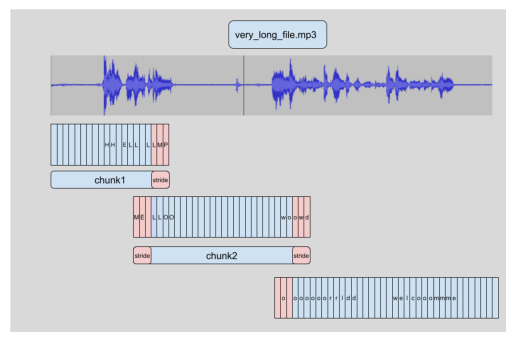

In [14]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic = mpimg.imread('images/5.3Striding.png')
pic.shape
plt.imshow(pic)
plt.axis('off') 
plt.show()

对样本进行分块的优点是我们不需要分块的结果转录后续块。拼接是在我们转录了块边界处的所有块之后完成的，因此我们转录块的顺序并不重要。算法是完全无状态的，所以我们甚至可以做 chunk与块同时！这允许我们对块进行批处理并通过模型并行运行它们，与顺序转录它们相比，提供了很大的计算速度。要了解有关 🤗 Transformers 中分块的更多信息，您可以参考这篇博文。

要激活长格式转录，我们必须在调用管道时添加一个附加参数。该参数 chunk_length_s控制分块段的长度（以秒为单位）。对于 Whisper，30 秒的块是最佳的，因为这符合 Whisper 期望的输入长度。

要激活批处理，我们需要将参数传递batch_size给管道。将它们放在一起，我们可以通过分块和批处理来转录长音频样本，如下所示：

In [15]:
pipe(
    long_audio,
    max_new_tokens=256,
    generate_kwargs={"task": "transcribe"},
    chunk_length_s=30,
    batch_size=8,
)

{'text': ' Entonces te deleitarás en Jehová y yo te haré subir sobre las alturas de la tierra y te daré a comer la heredad de apartó por su camino, mas Jehová car tu retaguaria. ¿Quiénes son estos que vuelan como nubes y como palomas a sus ventanas? Ciertamente a mí esperaran las islas y las naves de tarsis desde el principio para traer tus hijos de lejos y su plata y su oro con ellos al nombre de Jovato Dios y al Santo Israel que te ha glorificado. y por jefe y por maestro a las naciones. E hiciste con ellos alianza, amaste su cama donde quiera que la veías. Y fuiste al rey con un huento y multiplicaste tus perfumes, y enviaste tus embajadores lejos y te batiste hasta el profundo. Y del todo serán asoladas, la gloria deliva no vendrá ti, hallas, pinos y bojes juntamente para decorar el lugar de mi santuario, y yo honraré el lugar de mis pies, y vendrán a ti y y en el madera metal y en lugar de piedras hierro y pondré paz por tu tributo y justicia por tus exactores. Múltitura de camell

我们不会在这里打印整个输出，因为它很长（总共 312 个字）！在 16GB V100 GPU 上，您可以预期上述代码行的运行时间约为 3.45 秒，这对于 317 秒的音频样本来说相当不错。在 CPU 上，预计时间接近 30 秒。

Whisper 还能够预测音频数据的分段级时间戳。这些时间戳指示一小段音频的开始和结束时间，对于将转录与输入音频对齐特别有用。假设我们想要为视频提供隐藏式字幕 - 我们需要这些时间戳来了解转录的哪一部分对应于视频的特定片段，以便显示该时间的正确转录。

激活时间戳预测很简单，我们只需要设置参数即可return_timestamps=True。时间戳与我们之前使用的分块和批处理方法兼容，因此我们可以简单地将时间戳参数附加到之前的调用中：

In [16]:
pipe(
    long_audio,
    max_new_tokens=256,
    generate_kwargs={"task": "transcribe"},
    chunk_length_s=30,
    batch_size=8,
    return_timestamps=True,
)["chunks"]

[{'timestamp': (0.0, 26.4),
  'text': ' Entonces te deleitarás en Jehová, y yo te haré subir sobre las alturas de la tierra, y te daré a comer la heredad de Jacob tu padre, porque la boca de Jehová lo ha hablado. nosotros curados. Todos nosotros nos descarriamos como bejas, cada cual se apartó por su camino,'},
 {'timestamp': (26.4, 32.48),
  'text': ' mas Jehová cargó en él el pecado de todos nosotros. No es que partas tu pan con el'},
 {'timestamp': (32.48, 38.4),
  'text': ' hambriento y a los hombres herrantes metas en casa, que cuando vieres al desnudo lo cubras y no'},
 {'timestamp': (38.4, 49.3),
  'text': ' tescondas de tu carne, entonces nacerá tu luz como el alba y tu salud se dejará ver presto, E irá a tu justicia delante de ti y la gloria de Jehová será tu retaguaria.'},
 {'timestamp': (49.3, 54.1),
  'text': ' ¿Quiénes son estos que vuelan como nubes y como palomas a sus ventanas?'},
 {'timestamp': (54.1, 59.6),
  'text': ' Ciertamente a mí esperaran las islas y las naves 

瞧！我们有预测的文本以及相应的时间戳。

### 概括

Whisper 是一个强大的语音识别和翻译预训练模型。与 Wav2Vec2 相比，它具有更高的转录精度，输出包含标点符号和大小写。它可用于转录英语以及 96 种其他语言的语音，包括短音频片段和通过分块的较长音频片段。这些属性使其成为许多语音识别和翻译任务的可行模型，无需进行微调。该pipeline()方法提供了一种在单行 API 调用中运行推理并控制生成的预测的简单方法。

虽然 Whisper 模型在许多高资源语言上表现得非常好，但它在低资源语言（即训练数据不易获得的语言）上的转录和翻译准确性较低。某些语言的不同口音和方言之间的表现也有所不同，包括不同性别、种族、年龄或其他人口统计标准的说话者的准确率较低（参见Whisper 论文）。

为了提高低资源语言、口音或方言的性能，我们可以采用预先训练的 Whisper 模型，并在适当选择的数据的小型语料库上对其进行训练，这一过程称为微调。我们将证明，只需十个小时的额外数据，我们就可以将低资源语言上的 Whisper 模型的性能提高 100% 以上。在下一节中，我们将介绍选择数据集进行微调的过程。

## 选择数据集

与任何机器学习问题一样，我们的模型的好坏取决于我们训练它的数据。语音识别数据集在管理方式和涵盖的领域方面存在很大差异。要选择正确的数据集，我们需要将我们的标准与数据集提供的功能相匹配。

在选择数据集之前，我们首先需要了解关键的定义特征。

### 语音数据集的特征

1. 小时数

简而言之，训练小时数表明数据集有多大。它类似于 NLP 数据集中训练示例的数量。然而，数据集越大并不一定越好。如果我们想要一个具有良好泛化能力的模型，我们需要一个**多样化的**数据集，其中包含许多不同的说话者、领域和说话风格。

2. 域名

该域涉及数据的来源，无论是有声读物、播客、YouTube 还是财务会议。每个域都有不同的数据分布。例如，有声读物是在高质量录音室条件下录制的（没有背景噪音），文本取自书面文献。而对于 YouTube，音频可能包含更多背景噪音和更非正式的讲话风格。
我们需要将我们的域与我们在推理时预期的条件相匹配。例如，如果我们在有声读物上训练模型，我们就不能指望它在嘈杂的环境中表现良好。

3、说话风格

说话风格属于以下两类之一：
旁白：朗读剧本
自发的：无脚本的对话式演讲
音频和文本数据反映了说话的风格。由于叙述的文本是有脚本的，因此它往往能够清晰地说出并且没有任何错误：


“Consider the task of training a model on a speech recognition dataset”   
而对于自发演讲，我们可以期待一种更口语化的演讲风格，其中包括重复、犹豫和错误的开始：


“Let’s uhh let's take a look at how you'd go about training a model on uhm a sp- speech recognition dataset”

4. 转录风格

转录风格是指目标文本是否有标点符号、大小写或两者都有。如果我们希望系统生成可用于出版物或会议转录的完全格式化的文本，我们需要带有标点符号和大小写的训练数据。如果我们只需要未格式化结构的口语单词，则不需要标点符号和大小写。在这种情况下，我们可以选择一个没有标点符号或大小写的数据集，或者选择一个有标点符号和大小写的数据集，然后通过预处理将它们从目标文本中删除。

### Hub 上的数据集摘要

以下是 Hugging Face Hub 上最流行的英语语音识别数据集的摘要：

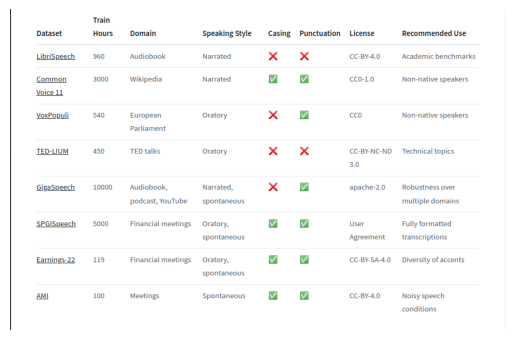

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic = mpimg.imread('images/5.4popularEnglishspeechrecognition.png')
pic.shape
plt.imshow(pic)
plt.axis('off') 
plt.show()

此表可作为根据您的标准选择数据集的参考。下面是多语言语音识别的等效表。请注意，我们省略了训练集时数列，因为该列因每个数据集的语言而异，并将其替换为每个数据集的语言数量：

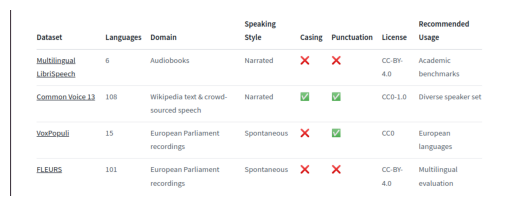

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic = mpimg.imread('images/5.5EquivalentTableforMultilingualSpeechRecognition.png')
pic.shape
plt.imshow(pic)
plt.axis('off') 
plt.show()

有关两个表中涵盖的音频数据集的详细分类，请参阅博客文章音频数据集完整指南。虽然 Hub 上有超过 180 个语音识别数据集，但可能没有符合您需求的数据集。在这种情况下，也可以将您自己的音频数据与🤗数据集一起使用。要创建自定义音频数据集，请参阅指南创建音频数据集。创建自定义音频数据集时，请考虑在 Hub 上共享最终数据集，以便社区中的其他人可以从您的努力中受益 - 音频社区具有包容性且范围广泛，其他人会像您所做的那样欣赏您的工作。

好吧！现在我们已经了解了选择 ASR 数据集的所有标准，让我们为本教程选择一个数据集。我们知道 Whisper 在以高资源语言（例如英语和西班牙语）转录数据方面已经做得相当不错，因此我们将专注于低资源多语言转录。我们希望保留 Whisper 预测标点符号和大小写的能力，因此从第二个表看来，Common Voice 13 是一个很好的候选数据集！

### Common Voice 13

Common Voice 13 是一个众包数据集，发言者用各种语言记录来自维基百科的文本。它是 Common Voice 系列的一部分，该系列是 Mozilla 基金会发布的 Common Voice 数据集的集合。在撰写本文时，Common Voice 13 是该数据集的最新版本，包含迄今为止所有版本中最多的语言和每种语言的时间。

我们可以通过查看 Hub 上的数据集页面来获取 Common Voice 13 数据集的完整语言列表： mozilla-foundation/common_voice_13_0。第一次查看此页面时，系统会要求您接受使用条款。之后，您将获得对数据集的完全访问权限。

一旦我们提供了使用数据集的身份验证，我们将看到数据集预览。数据集预览向我们展示了每种语言的数据集的前 100 个样本。此外，它还加载了可供我们实时收听的音频样本。对于本单元，我们将选择迪维希语 （或马尔代夫语），一种在南亚岛国马尔代夫使用的印度-雅利安语。虽然我们在本教程中选择 Dhivehi 语，但此处介绍的步骤适用于 Common Voice 13 数据集中 108 种语言中的任何一种，更普遍地适用于 Hugging Face Hub 上 180 多种音频数据集中的任何一种，因此没有对语言或方言的限制。

我们可以通过将子集设置为使用下拉菜单来选择 Common Voice 13 的迪维希语子集dv（dv是迪维希语的语言标识符代码）：

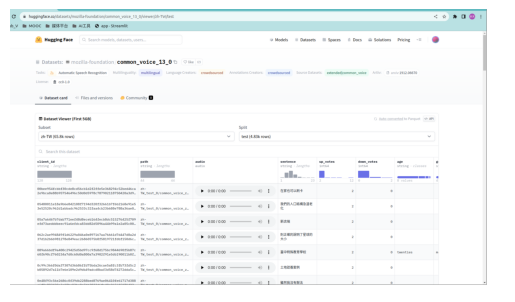

In [10]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic = mpimg.imread('images/5.10.png')
pic.shape
plt.imshow(pic)
plt.axis('off') 
plt.show()

<font style=background:red>zh-CN The dataset viewer is not available for this dataset.</font>

如果我们点击第一个样本的播放按钮，我们可以收听音频并看到相应的文本。滚动浏览训练集和测试集的样本，以更好地了解我们正在处理的音频和文本数据。从语调和风格上可以看出，这些录音是从旁白中提取的。您还可能会注意到扬声器和录音质量的巨大差异，这是众包数据的一个共同特征。

数据集预览是在投入使用之前体验音频数据集的绝佳方式。您可以选择 Hub 上的任何数据集，滚动样本并收听不同子集和分割的音频，衡量它是否是满足您需求的正确数据集。选择数据集后，加载数据就很简单了，以便您可以开始使用它。

现在，我个人不会说迪维希语，并且希望绝大多数读者也不会说！要知道我们的微调模型是否有效，我们需要一种严格的方法来评估未见过的数据并测量其转录准确性。我们将在下一节中详细介绍这一点！

## 语音识别的评估指标

如果您熟悉NLP 的编辑距离，那么评估语音识别系统的指标也会很熟悉！如果您不知道，请不要担心，我们将从头到尾进行解释，以确保您了解不同的指标并理解它们的含义。

在评估语音识别系统时，我们将系统的预测与目标文本转录进行比较，注释存在的任何错误。我们将这些错误分为三类之一：

1. 替换 (S)：我们在预测中转录错误的单词（“sit”而不是“sat”）

2. 插入（I）：我们在预测中添加额外的单词

3. 删除 (D)：我们在预测中删除一个单词

这些错误类别对于所有语音识别指标都是相同的。不同之处在于我们计算这些错误的级别：我们可以在单词级别或字符级别上计算它们。

我们将为每个指标定义使用一个运行示例。在这里，我们有一个基本事实或参考文本序列：

In [17]:
reference = "the cat sat on the mat"

以及我们试图评估的语音识别系统的预测序列：

In [18]:
prediction = "the cat sit on the"

我们可以看到，预测还是比较接近的，但是有些词不太准确。我们将根据三个最流行的语音识别指标的参考来评估此预测，并查看每个指标得到什么样的数字。

### 字错误率

*单词错误率 (WER)* 指标是语音识别的“事实上”指标。它计算*单词级别*上的替换、插入和删除。这意味着错误是逐字注释的。以我们的例子为例：

Reference:	the	cat	sat	on	the	mat

Prediction:	the	cat	sit	on	the	

Label:	    ✅	✅  S  ✅	  ✅	D

在这里，我们有：

1 次替换（用“sit”代替“sat”）

0 条插入

1 次删除（“mat”缺失）

这总共给出了 2 个错误。为了得到错误率，我们将错误数除以参考文献中的单词总数 (N)，在本例中为 6：

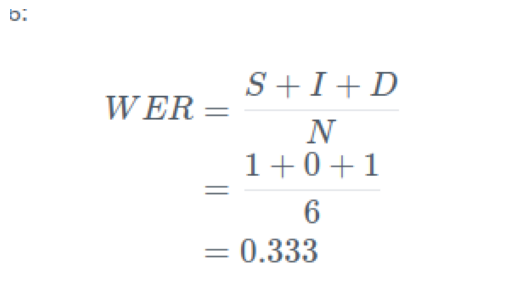

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic = mpimg.imread('images/5.7WSR.png')
pic.shape
plt.imshow(pic)
plt.axis('off') 
plt.show()

好吧！所以我们的 WER 为 0.333，即 33.3%。请注意“sit”一词只有一个字符是错误的，但整个单词都被标记为错误。这是 WER 的一个决定性特征：拼写错误无论多么轻微都会受到严厉处罚。

WER 的定义是越低越好：WER 越低意味着我们的预测中的错误越少，因此完美的语音识别系统的 WER 为零（没有错误）。

让我们看看如何使用 🤗 Evaluate 计算 WER。我们需要两个包来计算我们的 WER 指标：🤗 API 接口的评估，以及 JIWER 来完成运行计算的繁重工作：

pip install --upgrade evaluate jiwer

太棒了！我们现在可以加载 WER 指标并计算示例的数字：

In [19]:
from evaluate import load

wer_metric = load("wer")

wer = wer_metric.compute(references=[reference], predictions=[prediction])

print(wer)

0.3333333333333333


0.33，即 33.3%，正如预期的那样！我们现在知道 WER 计算的幕后情况。

现在，有一些令人困惑的事情……你认为 WER 的上限是多少？您会期望它是 1 或 100%，对吗？呃呃！由于 WER 是错误与单词数 (N) 的比率，因此 WER 没有上限！举个例子，我们预测 10 个单词，而目标只有 2 个单词。如果我们所有的预测都错了（10 个错误），我们的 WER 将为 10 / 2 = 5，即 500%！如果您训练 ASR 系统并看到 WER 超过 100%，则需要记住这一点。虽然如果你看到这个，很可能出了问题......😅

### 单词准确度

*单词错误率 (WER)* 指标是语音识别的“事实上”指标。它计算*单词级别*上的替换、插入和删除。这意味着错误是逐字注释的。以我们的例子为例：

WAcc=1−WER

WAcc 也是在单词级别上测量的，它只是将 WER 重新表述为准确度指标而不是错误指标。WAcc 在语音文献中很少被引用 - 我们根据单词错误来考虑我们的系统预测，因此更喜欢与这些错误类型注释更相关的错误率指标。

### 字符错误率

我们将“坐”的整个单词标记为错误，而实际上只有一个字母不正确，这似乎有点不公平。这是因为我们是在单词级别评估我们的系统，从而逐字注释错误。字符错误率 (CER)在字符级别评估系统。这意味着我们将单词分成单独的字符，并逐个字符地注释错误：

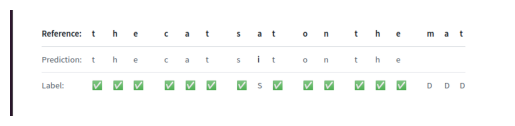

In [7]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic = mpimg.imread('images/5.8CharacterErrorRate.png')
pic.shape
plt.imshow(pic)
plt.axis('off') 
plt.show()

现在我们可以看到，对于单词“sit”，“s”和“t”被标记为正确。只有“i”被标记为替换错误（S）。因此，我们奖励我们的系统部分正确的预测🤝

在我们的示例中，有 1 次字符替换、0 次插入和 3 次删除。我们总共有 14 个角色。所以，我们的 CER 是：

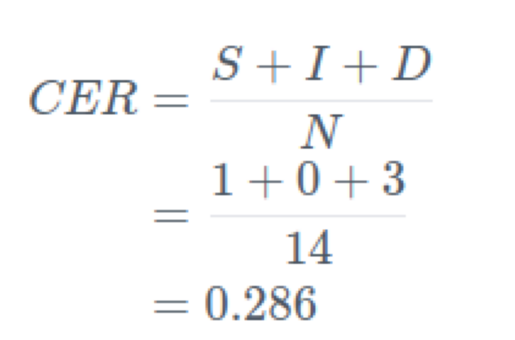

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic = mpimg.imread('images/5.9CER286.png')
pic.shape
plt.imshow(pic)
plt.axis('off') 
plt.show()

正确的！我们的 CER 为 0.286，即 28.6%。请注意，这比我们的 WER 低——我们对拼写错误的惩罚要少得多。

### 我应该使用哪个指标？

一般来说，在评估语音系统方面，WER 的使用远远多于 CER。这是因为 WER 要求系统更好地理解预测的背景。在我们的例子中，“sit”的时态是错误的。一个理解动词和句子时态之间关系的系统可以预测“sat”的正确动词时态。我们希望通过我们的语音系统来鼓励这种程度的理解。因此，虽然 WER 不如 CER 宽容，但它也更有利于我们想要开发的易理解系统。因此，我们通常使用 WER，并鼓励您也这样做！但是，在某些情况下无法使用 WER。某些语言，例如普通话和日语，没有“单词”的概念，因此这里WER毫无意义。

### 规范化

如果我们用带有标点符号和大小写的数据训练 ASR 模型，它将学习预测其转录中的大小写和标点符号。当我们想要将我们的模型用于实际的语音识别应用程序（例如转录会议或听写）时，这非常有用，因为预测的转录将完全采用大小写和标点符号进行格式化，这种样式称为规范化方法。

但是，我们还可以选择标准化数据集以删除任何大小写和标点符号。规范化数据集使语音识别任务变得更容易：模型不再需要区分大小写字符，或者必须仅根据音频数据预测标点符号（例如分号发出什么声音？）。正因为如此，单词错误率自然会更低（意味着结果更好）。Whisper 论文展示了标准化转录对 WER 结果的巨大影响（参见Whisper 论文的第 4.4 节））。虽然我们获得了较低的 WER，但该模型并不一定更适合生产。缺少大小写和标点符号使得模型预测的文本明显难以阅读。以上一节中的示例为例，我们在 LibriSpeech 数据集中的同一音频样本上运行 Wav2Vec2 和 Whisper。Wav2Vec2 模型既不预测标点符号也不预测大小写，而 Whisper 则两者都预测。并排比较抄本，我们发现 Whisper 抄本更容易阅读：

Wav2Vec2:  HE TELLS US THAT AT THIS FESTIVE SEASON OF THE YEAR WITH CHRISTMAUS AND ROSE BEEF LOOMING BEFORE US SIMALYIS DRAWN FROM EATING AND ITS RESULTS OCCUR MOST READILY TO THE MIND

Whisper:   He tells us that at this festive season of the year, with Christmas and roast beef looming before us, similarly is drawn from eating and its results occur most readily to the mind.

Whisper 转录是正字法，因此可以使用 - 它的格式与我们期望的会议转录或听写脚本一样，包含标点符号和大小写。相反，如果我们想将其用于下游应用程序，我们需要使用额外的后处理来恢复 Wav2Vec2 预测中的标点符号和大小写。

规范化和不规范化之间有一个折衷的办法：我们可以在拼写转录上训练我们的系统，然后在计算 WER 之前标准化预测和目标。通过这种方式，我们训练我们的系统来预测完全格式化的文本，同时也受益于我们通过标准化转录而获得的 WER 改进。

Whisper 模型发布时带有一个规范化器，可以有效处理大小写、标点符号和数字格式等的规范化。让我们将规范化器应用于 Whisper 转录，以演示如何对其进行规范化：

In [20]:
from transformers.models.whisper.english_normalizer import BasicTextNormalizer

normalizer = BasicTextNormalizer()

prediction = " He tells us that at this festive season of the year, with Christmas and roast beef looming before us, similarly is drawn from eating and its results occur most readily to the mind."
normalized_prediction = normalizer(prediction)

normalized_prediction

' he tells us that at this festive season of the year with christmas and roast beef looming before us similarly is drawn from eating and its results occur most readily to the mind '

太棒了！我们可以看到文本已完全小写并删除了所有标点符号。现在让我们定义参考转录，然后计算参考和预测之间的归一化 WER：

In [21]:
reference = "HE TELLS US THAT AT THIS FESTIVE SEASON OF THE YEAR WITH CHRISTMAS AND ROAST BEEF LOOMING BEFORE US SIMILES DRAWN FROM EATING AND ITS RESULTS OCCUR MOST READILY TO THE MIND"
normalized_referece = normalizer(reference)

wer = wer_metric.compute(
    references=[normalized_referece], predictions=[normalized_prediction]
)
wer

0.0625

6.25% - 这大约是我们对 LibriSpeech 验证集上的 Whisper 基础模型的预期。正如我们在这里看到的，我们已经预测了正字法转录，但受益于通过在计算 WER 之前对参考和预测进行归一化而获得的 WER 提升。

如何标准化转录的选择最终取决于您的需求。我们建议对正字法文本进行培训，并对规范化文本进行评估，以获得两全其美的效果。

### 把它们放在一起

好吧！到目前为止，我们在本单元中已经介绍了三个主题：预训练模型、数据集选择和评估。让我们享受一些乐趣，并将它们放在一个端到端示例中🚀 我们将通过在 Common Voice 13 zh-CN/Dhivehi 测试集上评估预训练的 Whisper 模型，为下一节的微调做好准备。我们将使用获得的 WER 数字作为微调运行的基线，或者我们将尝试超越的目标数字 🥊

首先，我们将使用该类加载预先训练的 Whisper 模型pipeline()。这个过程现在已经非常熟悉了！我们要做的唯一新事情是，如果在 GPU 上运行，则以半精度 (float16) 加载模型 - 这将加快推理速度，而几乎不会影响 WER 精度。

In [3]:
from transformers import pipeline
import torch

if torch.cuda.is_available():
    device = "cuda:0"
    torch_dtype = torch.float16
else:
    device = "cpu"
    torch_dtype = torch.float32

pipe = pipeline(
    "automatic-speech-recognition",
    model="openai/whisper-small",
    torch_dtype=torch_dtype,
    device=device,
)

Loading the tokenizer from the `special_tokens_map.json` and the `added_tokens.json` will be removed in `transformers 5`,  it is kept for forward compatibility, but it is recommended to update your `tokenizer_config.json` by uploading it again. You will see the new `added_tokens_decoder` attribute that will store the relevant information.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


接下来，我们将加载 Common Voice 13 的 Dhivehi 测试拆分。您会记得上一节中 Common Voice 13 是门控的，这意味着我们必须同意数据集使用条款才能访问数据集。现在，我们可以将 Hugging Face 帐户链接到笔记本，以便我们可以从当前使用的计算机访问数据集。

将笔记本电脑链接到集线器非常简单 - 只需在出现提示时输入您的集线器身份验证令牌即可。在此处找到您的集线器身份验证令牌并在出现提示时输入：

In [23]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
太棒了的！将笔记本链接到我们的 Hugging Face 帐户后，我们就可以继续下载 Common Voice 数据集。这将需要几分钟的时间来下载和预处理，从 Hugging Face Hub 中获取数据并在笔记本上自动准备：

In [24]:
# from datasets import load_dataset

# common_voice_test = load_dataset(
#     "mozilla-foundation/common_voice_13_0", "zh-CN", split="test"
# )

Extracting data files:   0%|          | 0/5 [00:00<?, ?it/s]

Extracting data files:   0%|          | 0/5 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]


Reading metadata...: 0it [00:00, ?it/s]
Reading metadata...: 8462it [00:00, 84603.74it/s]
Reading metadata...: 19066it [00:00, 97207.18it/s]
Reading metadata...: 29383it [00:00, 93761.85it/s]


Generating validation split: 0 examples [00:00, ? examples/s]


Reading metadata...: 0it [00:00, ?it/s]
Reading metadata...: 10624it [00:00, 79511.60it/s][A


Generating test split: 0 examples [00:00, ? examples/s]


Reading metadata...: 0it [00:00, ?it/s]
Reading metadata...: 10624it [00:00, 93443.84it/s][A


Generating other split: 0 examples [00:00, ? examples/s]


Reading metadata...: 0it [00:00, ?it/s]
Reading metadata...: 9294it [00:00, 92935.88it/s]
Reading metadata...: 21185it [00:00, 108207.27it/s]
Reading metadata...: 32064it [00:00, 108459.70it/s]
Reading metadata...: 42910it [00:00, 104643.07it/s]
Reading metadata...: 53394it [00:00, 102252.92it/s]
Reading metadata...: 63637it [00:00, 102192.31it/s]
Reading metadata...: 74766it [00:00, 105094.17it/s]
Reading metadata...: 85290it [00:00, 103358.09it/s]
Reading metadata...: 95639it [00:00, 103159.16it/s]
Reading metadata...: 105964it [00:01, 99635.41it/s]
Reading metadata...: 115954it [00:01, 98402.59it/s]
Reading metadata...: 126635it [00:01, 100870.26it/s]
Reading metadata...: 137039it [00:01, 101795.03it/s]
Reading metadata...: 147840it [00:01, 103632.11it/s]
Reading metadata...: 158219it [00:01, 100972.70it/s]
Reading metadata...: 168340it [00:01, 97388.05it/s] 
Reading metadata...: 178115it [00:01, 94918.61it/s]
Reading metadata...: 187637it [00:01, 88003.13it/s]
Reading metadata...:

Generating invalidated split: 0 examples [00:00, ? examples/s]


Reading metadata...: 0it [00:00, ?it/s]
Reading metadata...: 9050it [00:00, 90470.54it/s]
Reading metadata...: 18098it [00:00, 90439.88it/s]
Reading metadata...: 28892it [00:00, 98427.45it/s]
Reading metadata...: 38735it [00:00, 87671.70it/s]
Reading metadata...: 56661it [00:00, 92512.98it/s]


In [1]:
from datasets import load_dataset

common_voice_test2 = load_dataset(
    "mozilla-foundation/common_voice_13_0", "dv", split="test"
)

<font color=green>如果您在加载数据集时遇到身份验证问题，请确保您已通过以下链接接受 Hugging Face Hub 上数据集的使用条款：https://huggingface.co/datasets/mozilla-foundation/common_voice_13_0</font>

对整个数据集进行评估的方式与对单个示例的评估方式大致相同 - 我们所要做的就是循环 输入音频，而不是仅推断单个样本。为此，我们首先将数据集转换为 KeyDataset. 所有这一切都是挑选出我们想要转发到模型的特定数据集列（在我们的例子中，就是该列"audio"），忽略其余部分（例如目标转录，我们不想将其用于推理）。然后，我们迭代这个转换后的数据集，将模型输出附加到列表中以保存预测。如果在半精度 GPU 上运行（峰值内存为 6GB），以下代码单元大约需要 30 分钟：

In [25]:
# from tqdm import tqdm
# from transformers.pipelines.pt_utils import KeyDataset

# all_predictions = []

# # run streamed inference
# for prediction in tqdm(
#     pipe(
#         KeyDataset(common_voice_test, "audio"),
#         max_new_tokens=128,
#         generate_kwargs={"task": "transcribe"},
#         batch_size=16,
#     ),
#     total=len(common_voice_test),
# ):
#     all_predictions.append(prediction["text"])

100%|███████████████████████████████████| 10624/10624 [1:36:28<00:00,  1.84it/s]


In [5]:
from tqdm import tqdm
from transformers.pipelines.pt_utils import KeyDataset

all_predictions = []

# run streamed inference
for prediction in tqdm(
    pipe(
        KeyDataset(common_voice_test2, "audio"),
        max_new_tokens=128,
        generate_kwargs={"task": "transcribe"},
        batch_size=16,
    ),
    total=len(common_voice_test2),
):
    all_predictions.append(prediction["text"])

100%|███████████████████████████████████████| 2212/2212 [28:07<00:00,  1.31it/s]


<font color=greenyellow>如果您在运行上述单元时遇到 CUDA 内存不足 (OOM)，请逐步将“batch_size”减小 2 倍，直到找到适合您的设备的批量大小。</font>

最后，我们可以计算 WER。我们首先计算正交 WER，即没有任何后处理的 WER：

In [26]:
# from evaluate import load

# wer_metric = load("wer")

# wer_ortho = 100 * wer_metric.compute(
#     references=common_voice_test["sentence"], predictions=all_predictions
# )
# wer_ortho
#zh-CN :101.79764705882353

101.79764705882353

In [6]:
from evaluate import load

wer_metric = load("wer")

wer_ortho = 100 * wer_metric.compute(
    references=common_voice_test2["sentence"], predictions=all_predictions
)
wer_ortho
# local:148.42955637579217
# colab: 147.99080715927292

148.42955637579217

好吧……167% 本质上意味着我们的模型正在输出垃圾 😜 别担心，我们的目标是通过在迪维希语训练集上微调模型来改进这一点！

接下来，我们将评估归一化的 WER，即经过归一化后处理的 WER。我们必须过滤掉标准化后为空的样本，否则我们的参考（N）中的单词总数将为零，这将在我们的计算中产生除以零的错误：

In [27]:
# from transformers.models.whisper.english_normalizer import BasicTextNormalizer

# normalizer = BasicTextNormalizer()

# # compute normalised WER
# all_predictions_norm = [normalizer(pred) for pred in all_predictions]
# all_references_norm = [normalizer(label) for label in common_voice_test["sentence"]]

# # filtering step to only evaluate the samples that correspond to non-zero references
# all_predictions_norm = [
#     all_predictions_norm[i]
#     for i in range(len(all_predictions_norm))
#     if len(all_references_norm[i]) > 0
# ]
# all_references_norm = [
#     all_references_norm[i]
#     for i in range(len(all_references_norm))
#     if len(all_references_norm[i]) > 0
# ]

# wer = 100 * wer_metric.compute(
#     references=all_references_norm, predictions=all_predictions_norm
# )

# wer
#zh-CN :106.75546269696179

106.75546269696179

In [7]:
from transformers.models.whisper.english_normalizer import BasicTextNormalizer

normalizer = BasicTextNormalizer()

# compute normalised WER
all_predictions_norm = [normalizer(pred) for pred in all_predictions]
all_references_norm = [normalizer(label) for label in common_voice_test2["sentence"]]

# filtering step to only evaluate the samples that correspond to non-zero references
all_predictions_norm = [
    all_predictions_norm[i]
    for i in range(len(all_predictions_norm))
    if len(all_references_norm[i]) > 0
]
all_references_norm = [
    all_references_norm[i]
    for i in range(len(all_references_norm))
    if len(all_references_norm[i]) > 0
]

wer = 100 * wer_metric.compute(
    references=all_references_norm, predictions=all_predictions_norm
)

wer
# local:109.47769238794032
# colab: 109.50029558020655

109.47769238794032

我们再次看到，通过规范化参考和预测，我们实现了 WER 的大幅降低：基线模型实现了 148% 的拼字测试 WER，而规范化的 WER 为 109%。

就在那时！这些是我们在微调模型时想要尝试并超越的数字，以改进迪维希语语音识别的 Whisper 模型。继续阅读以实践微调示例🚀

<font color=Gold>zh-CN 基线模型实现了 101.79764705882353% 的拼字测试 WER，而规范化的 WER 为 106.75546269696179%。说明对于中文本文介绍的规范化的方法并不适用</font>


## 如何使用 Trainer API 微调 ASR 系统

在本节中，我们将介绍有关在 Common Voice 13 数据集上微调 Whisper 进行语音识别的分步指南。我们将使用模型的“小”版本和相对轻量级的数据集，使您能够在磁盘空间要求较低的任何 16GB 以上 GPU 上相当快速地运行微调，例如 Google Colab 免费套餐中提供的 16GB T4 GPU 。

如果您的 GPU 较小或在训练期间遇到内存问题，您可以按照提供的建议来减少内存使用量。相反，如果您可以使用更大的 GPU，则可以修改训练参数以最大化吞吐量。因此，无论您的 GPU 规格如何，都可以访问本指南！

同样，本指南概述了如何针对迪维希语微调 Whisper 模型。但是，此处介绍的步骤适用于 Common Voice 数据集中的任何语言，更普遍地适用于 Hugging Face Hub 上的任何 ASR 数据集。您可以调整代码以快速切换到您选择的语言，并用您的母语微调 Whisper 模型 🌍

好吧！现在一切都以到位，让我们开始并启动我们的微调管道吧！

### 准备环境

我们强烈建议您在训练时直接将模型检查点上传到Hugging Face Hub。该中心提供：

    集成版本控制：您可以确保训练期间不会丢失任何模型检查点。
    Tensorboard 日志：跟踪训练过程中的重要指标。
    模型卡：记录模型的用途及其预期用例。
    社区：与社区分享和协作的简单方式！🤗
将笔记本电脑链接到集线器非常简单 - 只需在出现提示时输入您的集线器身份验证令牌即可。

In [8]:
from huggingface_hub import notebook_login

notebook_login()

### 加载数据集

Common Voice 13包含大约十个小时的标记迪维希语数据，其中三个是保留的测试数据。用于微调的数据极少，因此我们将依赖于利用 Whisper 在资源匮乏的迪维希语预训练期间获得的广泛多语言 ASR 知识。

使用🤗数据集，下载和准备数据非常简单。我们只需一行代码即可下载并准备 Common Voice 13 分割。由于迪维希语资源非常匮乏，我们将结合train和validation分割来提供大约七个小时的训练数据。我们将使用三个小时的test数据作为我们保留的测试集：

In [9]:
from datasets import load_dataset, DatasetDict

common_voice = DatasetDict()

common_voice["train"] = load_dataset(
    "mozilla-foundation/common_voice_13_0", "dv", split="train+validation"
)
common_voice["test"] = load_dataset(
    "mozilla-foundation/common_voice_13_0", "dv", split="test"
)

print(common_voice)

DatasetDict({
    train: Dataset({
        features: ['client_id', 'path', 'audio', 'sentence', 'up_votes', 'down_votes', 'age', 'gender', 'accent', 'locale', 'segment', 'variant'],
        num_rows: 4904
    })
    test: Dataset({
        features: ['client_id', 'path', 'audio', 'sentence', 'up_votes', 'down_votes', 'age', 'gender', 'accent', 'locale', 'segment', 'variant'],
        num_rows: 2212
    })
})


<font color=Green>您可以将语言标识符从“dv”更改为您选择的语言标识符。要查看 Common Voice 13 中所有可能的语言，请查看 Hugging Face Hub 上的数据集卡：https://huggingface.co/datasets/mozilla-foundation/common_voice_13_0</font>

大多数 ASR 数据集仅提供输入音频样本 ( audio) 和相应的转录文本 ( sentence)。Common Voice 包含额外的元数据信息，例如accent和locale，我们可以忽略 ASR。为了使笔记本尽可能通用，我们只考虑输入音频和转录文本进行微调，丢弃额外的元数据信息：

In [10]:
common_voice = common_voice.select_columns(["audio", "sentence"])

### 特征提取器、分词器和处理器

ASR 管道可以分解为三个阶段：

    1. 将原始音频输入预处理为对数梅尔频谱图的特征提取器
    2. 执行序列到序列映射的模型
    3. 将预测标记后处理为文本的标记生成器

在🤗 Transformers 中，Whisper 模型有一个关联的特征提取器和分词器，分别称为WhisperFeatureExtractor和WhisperTokenizer 。为了让我们的生活变得简单，这两个对象被包装在一个类下，称为WhisperProcessor。我们可以调用 WhisperProcessor 来执行音频预处理和文本标记后处理。这样做，我们只需要在训练期间跟踪两个对象：处理器和模型。

在进行多语言微调时，我们需要在实例化处理器时设置"language"和。"task"应"language"设置为源音频语言，并将任务设置"transcribe"为语音识别或 "translate"语音翻译。这些参数会修改分词器的行为，并且应正确设置以确保目标标签正确编码。

我们可以通过导入语言列表来查看 Whisper 支持的所有可能的语言：

In [11]:
from transformers.models.whisper.tokenization_whisper import TO_LANGUAGE_CODE

TO_LANGUAGE_CODE

{'english': 'en',
 'chinese': 'zh',
 'german': 'de',
 'spanish': 'es',
 'russian': 'ru',
 'korean': 'ko',
 'french': 'fr',
 'japanese': 'ja',
 'portuguese': 'pt',
 'turkish': 'tr',
 'polish': 'pl',
 'catalan': 'ca',
 'dutch': 'nl',
 'arabic': 'ar',
 'swedish': 'sv',
 'italian': 'it',
 'indonesian': 'id',
 'hindi': 'hi',
 'finnish': 'fi',
 'vietnamese': 'vi',
 'hebrew': 'he',
 'ukrainian': 'uk',
 'greek': 'el',
 'malay': 'ms',
 'czech': 'cs',
 'romanian': 'ro',
 'danish': 'da',
 'hungarian': 'hu',
 'tamil': 'ta',
 'norwegian': 'no',
 'thai': 'th',
 'urdu': 'ur',
 'croatian': 'hr',
 'bulgarian': 'bg',
 'lithuanian': 'lt',
 'latin': 'la',
 'maori': 'mi',
 'malayalam': 'ml',
 'welsh': 'cy',
 'slovak': 'sk',
 'telugu': 'te',
 'persian': 'fa',
 'latvian': 'lv',
 'bengali': 'bn',
 'serbian': 'sr',
 'azerbaijani': 'az',
 'slovenian': 'sl',
 'kannada': 'kn',
 'estonian': 'et',
 'macedonian': 'mk',
 'breton': 'br',
 'basque': 'eu',
 'icelandic': 'is',
 'armenian': 'hy',
 'nepali': 'ne',
 'mongol

如果您滚动浏览此列表，您会发现存在多种语言，但迪维希语是少数不存在的语言之一！这意味着 Whisper 没有接受过迪维希语预训练。然而，这并不意味着我们不能对 Whisper 进行微调。在此过程中，我们将教 Whisper 一种新语言，一种预训练检查点不支持的语言。这很酷，对吧！

当您针对新语言对其进行微调时，Whisper 可以很好地利用其预先训练过的其他 96 种语言的知识。很大程度上来说，所有现代语言在语言上都与 Whisper 已知的 96 种语言中的至少一种相似，因此我们将属于这种跨语言知识表示的范式。

为了在新语言上对 Whisper 进行微调，我们需要做的是找到与Whisper 预训练最相似的语言。维基百科有关迪维希语的文章指出，迪维希语与斯里兰卡的僧伽罗语密切相关。如果我们再次检查语言代码，我们可以看到 Whisper 语言集中存在僧伽罗语，因此我们可以安全地将语言参数设置为"sinhalese"。

好的！我们将从预先训练的检查点加载处理器，将语言"sinhalese"和任务设置为"transcribe" 如上所述：

In [12]:
from transformers import WhisperProcessor

processor = WhisperProcessor.from_pretrained(
    "openai/whisper-small", language="sinhalese", task="transcribe"
)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


值得重申的是，在大多数情况下，您会发现您想要微调的语言位于预训练语言集中，在这种情况下，您可以直接将该语言设置为源音频语言！请注意，对于仅英语微调，应省略这两个参数，其中语言 ( "English") 和任务 ( "transcribe") 只有一个选项。

### 预处理数据

让我们看一下数据集特征。请特别注意该"audio"列 - 该列详细介绍了我们的音频输入的采样率：

In [13]:
common_voice[ "train" ].features

{'audio': Audio(sampling_rate=48000, mono=True, decode=True, id=None),
 'sentence': Value(dtype='string', id=None)}

由于我们的输入音频以 48kHz 采样，因此我们需要在将其传递到 Whisper 特征提取器之前将其下采样到 16kHz，16kHz 是 Whisper 模型预期的采样率。

我们将使用数据集的方法将音频输入设置为正确的采样率cast_column 。此操作不会就地更改音频，而是向数据集发出信号，以便在加载音频样本时即时对其进行重新采样：

In [14]:
from datasets import Audio

sampling_rate = processor.feature_extractor.sampling_rate
common_voice = common_voice.cast_column("audio", Audio(sampling_rate=sampling_rate))

现在我们可以编写一个函数来为模型准备数据：

    1.我们通过调用 逐个样本地加载和重新采样音频数据sample["audio"]。如上所述，🤗 数据集即时执行任何必要的重采样操作。
    2.我们使用特征提取器从一维音频数组计算 log-mel 声谱图输入特征。
    3.我们通过使用分词器对转录进行编码以标记 id。

In [15]:
def prepare_dataset(example):
    audio = example["audio"]

    example = processor(
        audio=audio["array"],
        sampling_rate=audio["sampling_rate"],
        text=example["sentence"],
    )

    # compute input length of audio sample in seconds
    example["input_length"] = len(audio["array"]) / audio["sampling_rate"]

    return example

我们可以使用🤗数据集的方法将数据准备功能应用于所有训练示例.map。我们将从原始训练数据（音频和文本）中删除列，只留下函数返回的列 prepare_dataset：

In [16]:
common_voice = common_voice.map(
    prepare_dataset, remove_columns=common_voice.column_names["train"], num_proc=1
)

Map:   0%|          | 0/4904 [00:00<?, ? examples/s]

Map:   0%|          | 0/2212 [00:00<?, ? examples/s]

最后，我们过滤音频样本长度超过 30 秒的所有训练数据。否则这些样本会被 Whisper 特征提取器截断，这可能会影响训练的稳定性。我们定义一个函数，返回True小于 30 秒的样本以及False更长的样本：

In [17]:
max_input_length = 30.0


def is_audio_in_length_range(length):
    return length < max_input_length

我们通过 🤗 Datasets.filter方法将过滤函数应用于训练数据集的所有样本：

In [18]:
common_voice["train"] = common_voice["train"].filter(
    is_audio_in_length_range,
    input_columns=["input_length"],
)

Filter:   0%|          | 0/4904 [00:00<?, ? examples/s]

让我们检查一下通过此过滤步骤删除了多少训练数据：

In [19]:
common_voice["train"]

Dataset({
    features: ['input_features', 'labels', 'input_length'],
    num_rows: 4904
})

好吧！在这种情况下，我们实际上拥有与之前相同数量的样本，因此没有超过 30 秒的样本。如果您切换语言，情况可能并非如此，因此最好保留此过滤步骤以保持稳健性。这样，我们就已经为训练做好了充分的数据准备！让我们继续看看如何使用这些数据来微调 Whisper。

### 训练与评估

现在我们已经准备好了数据，我们准备好深入训练管道了。🤗 培训师将为 我们完成大部分繁重的工作。我们所要做的就是：

    定义数据整理器：数据整理器获取我们预处理的数据并为模型准备 PyTorch 张量。

    评估指标：在评估过程中，我们希望使用单词错误率（WER）指标来评估模型。我们需要定义一个compute_metrics处理此计算的函数。

    加载预训练的检查点：我们需要加载预训练的检查点并正确配置它以进行训练。

    定义训练参数：🤗 培训师将在构建训练计划时使用这些参数。

一旦我们对模型进行了微调，我们将根据测试数据对其进行评估，以验证我们是否已正确训练它来转录迪维希语语音。

#### 定义数据收集器

序列到序列语音模型的数据整理器是独特的，因为它独立地处理 和input_features ：labels必须 input_features由特征提取器处理， 必须labels由分词器处理。

它们input_features已经填充到 30 秒并转换为固定维度的 log-Mel 谱图，因此我们要做的就是将它们转换为批处理的 PyTorch 张量。我们使用特征提取器的.pad方法来 完成此操作return_tensors=pt。请注意，这里没有应用额外的填充，因为输入具有固定尺寸，它们 input_features只是转换为 PyTorch 张量。

另一方面，它们labels没有填充。我们首先使用分词器的方法将序列填充到批次中的最大长度.pad。然后将填充标记替换为，-100以便在计算损失时不考虑这些标记。然后，我们从标签序列的开头切掉转录标记的开头，并在稍后的训练过程中附加它。

我们可以利用WhisperProcessor之前定义的来执行特征提取器和分词器操作：

In [20]:
import torch

from dataclasses import dataclass
from typing import Any, Dict, List, Union


@dataclass
class DataCollatorSpeechSeq2SeqWithPadding:
    processor: Any

    def __call__(
        self, features: List[Dict[str, Union[List[int], torch.Tensor]]]
    ) -> Dict[str, torch.Tensor]:
        # split inputs and labels since they have to be of different lengths and need different padding methods
        # first treat the audio inputs by simply returning torch tensors
        input_features = [
            {"input_features": feature["input_features"][0]} for feature in features
        ]
        batch = self.processor.feature_extractor.pad(input_features, return_tensors="pt")

        # get the tokenized label sequences
        label_features = [{"input_ids": feature["labels"]} for feature in features]
        # pad the labels to max length
        labels_batch = self.processor.tokenizer.pad(label_features, return_tensors="pt")

        # replace padding with -100 to ignore loss correctly
        labels = labels_batch["input_ids"].masked_fill(
            labels_batch.attention_mask.ne(1), -100
        )

        # if bos token is appended in previous tokenization step,
        # cut bos token here as it's append later anyways
        if (labels[:, 0] == self.processor.tokenizer.bos_token_id).all().cpu().item():
            labels = labels[:, 1:]

        batch["labels"] = labels

        return batch

我们现在可以初始化刚刚定义的数据整理器：

In [21]:
data_collator = DataCollatorSpeechSeq2SeqWithPadding(processor=processor)

#### 评估指标

接下来，我们定义将在评估集上使用的评估指标。我们将使用上一节中介绍的单词错误率 (WER) 指标我们将使用评估，这是评估 ASR 系统的“事实上的”指标。

我们将从 🤗 Evaluate 加载 WER 指标：

In [22]:
import evaluate

metric = evaluate.load("wer")

然后，我们只需定义一个函数来接受模型预测并返回 WER 指标。这个函数，称为 compute_metrics，首先替换-100为pad_token_idin label_ids（撤消我们在数据整理器中应用的步骤，以在损失中正确忽略填充的标记）。然后它将预测 ID 和标签 ID 解码为字符串。最后，它计算预测和参考标签之间的 WER。在这里，我们可以选择使用“标准化”转录和预测进行评估，其中已删除标点符号和大小写。我们建议您遵循此操作，以便从通过标准化转录获得的 WER 改进中受益。

In [23]:
from transformers.models.whisper.english_normalizer import BasicTextNormalizer

normalizer = BasicTextNormalizer()


def compute_metrics(pred):
    pred_ids = pred.predictions
    label_ids = pred.label_ids

    # replace -100 with the pad_token_id
    label_ids[label_ids == -100] = processor.tokenizer.pad_token_id

    # we do not want to group tokens when computing the metrics
    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    label_str = processor.batch_decode(label_ids, skip_special_tokens=True)

    # compute orthographic wer
    wer_ortho = 100 * metric.compute(predictions=pred_str, references=label_str)

    # compute normalised WER
    pred_str_norm = [normalizer(pred) for pred in pred_str]
    label_str_norm = [normalizer(label) for label in label_str]
    # filtering step to only evaluate the samples that correspond to non-zero references:
    pred_str_norm = [
        pred_str_norm[i] for i in range(len(pred_str_norm)) if len(label_str_norm[i]) > 0
    ]
    label_str_norm = [
        label_str_norm[i]
        for i in range(len(label_str_norm))
        if len(label_str_norm[i]) > 0
    ]

    wer = 100 * metric.compute(predictions=pred_str_norm, references=label_str_norm)

    return {"wer_ortho": wer_ortho, "wer": wer}

#### 加载预先训练的检查点

现在让我们加载预先训练的 Whisper 小检查点。再说一次，通过使用 🤗 Transformers，这一切都是微不足道的！

In [24]:
from transformers import WhisperForConditionalGeneration

model = WhisperForConditionalGeneration.from_pretrained("openai/whisper-small")

我们将设置use_cache为False训练，因为我们使用梯度检查点 并且两者不兼容。我们还将覆盖两个生成参数来控制推理过程中模型的行为：我们将通过设置 和 参数在生成过程中强制使用语言和任务标记language，task并重新启用生成缓存以加快推理时间：

In [25]:
from functools import partial

# disable cache during training since it's incompatible with gradient checkpointing
model.config.use_cache = False

# set language and task for generation and re-enable cache
model.generate = partial(
    model.generate, language="sinhalese", task="transcribe", use_cache=True
)

#### 定义训练配置

在最后一步中，我们定义与训练相关的所有参数。在这里，我们将训练步骤数设置为 500。与预先训练的 Whisper 模型相比，这足以看到 WER 的巨大改进，同时确保可以在 Google Colab 免费套餐上在大约 45 分钟内运行微调。有关训练参数的更多详细信息，请参阅 Seq2SeqTrainingArguments文档。

In [33]:
from transformers import Seq2SeqTrainingArguments

training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-small-dv",  # name on the HF Hub
    per_device_train_batch_size=2,
    gradient_accumulation_steps=8,  # increase by 2x for every 2x decrease in batch size
    learning_rate=1e-5,
    lr_scheduler_type="linear",
    warmup_steps=50,
    max_steps=4000,  # increase to 4000 if you have your own GPU or a Colab paid plan
    gradient_checkpointing=True,
    fp16=True,
    fp16_full_eval=True,
    evaluation_strategy="steps",
    per_device_eval_batch_size=2,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=500,
    eval_steps=500,
    logging_steps=25,
    report_to=["tensorboard"],
    load_best_model_at_end=True,
    metric_for_best_model="wer",
    greater_is_better=False,
    push_to_hub=True,
)

<font color=Green>如果您不想将模型检查点上传到 Hub，请设置 `push_to_hub=False`。</font>

compute_metrics我们可以将训练参数连同我们的模型、数据集、数据整理器和函数一起转发给🤗 Trainer ：

In [34]:
from transformers import Seq2SeqTrainer

trainer = Seq2SeqTrainer(
    args=training_args,
    model=model,
    train_dataset=common_voice["train"],
    eval_dataset=common_voice["test"],
    data_collator=data_collator,
    compute_metrics=compute_metrics,
    tokenizer=processor,
)

这样，我们就可以开始训练了！

#### 训练

要启动训练，只需执行：

In [35]:
trainer.train()
# Colab
# Step	Training Loss Validation Loss	Wer Ortho	Wer
# 500	0.122500	     0.167725	    62.023818	12.727336

Step,Training Loss,Validation Loss


KeyboardInterrupt: 

训练大约需要 45 分钟，具体取决于您的 GPU 或分配给 Google Colab 的 GPU。"out-of-memory"根据您的 GPU，开始训练时您可能会遇到 CUDA错误。在这种情况下，您可以将per_device_train_batch_size增量减少 2 倍并采用gradient_accumulation_steps 补偿。

我们的最终 WER 是 14.1% - 对于 7 小时的训练数据和 500 个训练步骤来说还不错！与预训练模型相比，这相当于提高了 112%！这意味着我们采用了一个以前对迪维希语一无所知的模型，并对它进行了微调，以在不到一小时的时间内足够准确地识别迪维希语语音 🤯

最大的问题是这与其他 ASR 系统相比如何。为此，我们可以查看自动评估排行榜，该排行榜按语言和数据集对模型进行分类，然后根据模型的 WER 对它们进行排名。

查看排行榜，我们发现经过 500 步训练的模型令人信服地击败了我们在上一节中评估的预训练Whisper Small检查点。干得好👏

我们看到有一些检查点比我们训练的检查点做得更好。Hugging Face Hub 的美妙之处在于它是一个协作平台 - 如果我们没有时间或资源来自己进行较长时间的训练，我们可以加载社区中其他人已经训练过的检查点，并且足够友善分享（一定要感谢他们！）。pipeline您将能够以与我们之前使用该类预先训练的检查点完全相同的方式加载这些检查点！因此，没有什么可以阻止您在排行榜上挑选最佳模型来完成您的任务！

当我们将训练结果推送到 Hub 时，我们可以自动将检查点提交到排行榜 - 我们只需设置适当的关键字参数 (kwargs)。您可以更改这些值以相应地匹配您的数据集、语言和模型名称：

In [ ]:
kwargs = {
    "dataset_tags": "mozilla-foundation/common_voice_13_0",
    "dataset": "Common Voice 13",  # a 'pretty' name for the training dataset
    "language": "dv",
    "model_name": "Whisper Small Dv - Sanchit Gandhi",  # a 'pretty' name for your model
    "finetuned_from": "openai/whisper-small",
    "tasks": "automatic-speech-recognition",
}

现在可以将训练结果上传到 Hub。为此，请执行push_to_hub命令：

In [ ]:
trainer.push_to_hub(**kwargs)

这将保存训练日志和模型权重"your-username/the-name-you-picked"。对于此示例，请查看 上的上传sanchit-gandhi/whisper-small-dv。

虽然微调模型在 Common Voice 13 Dhivehi 测试数据上产生了令人满意的结果，但它绝不是最佳的。本指南的目的是演示如何使用 🤗 Trainer 微调 ASR 模型以进行多语言语音识别。

如果您可以使用自己的 GPU 或订阅了 Google Colab 付费计划，则可以将max_steps步数增加到 4000，通过训练更多步数来进一步提高 WER。4000 步的训练大约需要 3-5 小时，具体取决于您的 GPU，并且产生的 WER 结果比 500 步的训练低大约 3%。如果您决定训练 4000 步，我们还建议将学习率调度程序更改为线性调度程序（设置lr_scheduler_type="linear"），因为这将在长时间训练运行中产生额外的性能提升。

通过优化训练超参数（例如学习率和 dropout）以及使用更大的预训练检查点（medium或large），结果可能会进一步改善。我们将其作为练习留给读者。

#### 分享您的模型

您现在可以使用中心上的链接与任何人共享此模型。他们可以将其与标识符一起"your-username/the-name-you-picked" 直接加载到pipeline()对象中。例如，要加载微调的检查点“zongxiao/whisper-small-dv”：

In [ ]:
from transformers import pipeline

pipe = pipeline("automatic-speech-recognition", model="zongxiao/whisper-small-dv")

### 结论

在本节中，我们介绍了如何微调 Whisper 模型以进行语音识别🤗 数据集、Transformers 和 Hugging Face Hub 的分步指南。我们首先加载 Common Voice 13 数据集的 Dhivehi 子集，并通过计算 log-mel 频谱图和对文本进行标记来对其进行预处理。然后，我们定义了数据整理器、评估指标和训练参数，然后使用 🤗 Trainer 训练和评估我们的模型。最后，我们将微调后的模型上传到 Hugging Face Hub，并展示了如何与全班分享和使用它pipeline()。

如果您坚持到这一点，您现在应该有一个针对语音识别的微调检查点，干得好！🥳 更重要的是，您配备了在任何语音识别数据集或领域上微调 Whisper 模型所需的所有工具。你还在等什么！选择“选择数据集”部分中介绍的数据集之一 或选择您自己的数据集，看看是否可以获得最先进的性能！排行榜正在等你……

## 构建演示

现在我们已经针对迪维希语语音识别微调了 Whisper 模型，让我们继续构建一个Gradio 演示来向社区展示它！

要做的第一件事是使用该类加载经过微调的检查点- 这在预训练模型pipeline()部分中非常熟悉。您可以将 更改为 Hugging Face Hub 上微调模型的命名空间，或预先训练的Whisper 模型之一 以执行零样本语音识别：model_id

In [1]:
from transformers import pipeline

model_id = "zongxiao/whisper-small-dv"  # update with your model id
pipe = pipeline("automatic-speech-recognition", model=model_id)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


其次，我们将定义一个函数，该函数获取音频输入的文件路径并将其通过管道传递。在这里，管道自动负责加载音频文件，将其重新采样到正确的采样率，并使用模型运行推理。然后我们可以简单地将转录的文本作为函数的输出返回。为了确保我们的模型可以处理任意长度的音频输入，我们将启用分块，如预训练模型部分中所述：

In [2]:
def transcribe_speech(filepath):
    output = pipe(
        filepath,
        max_new_tokens=256,
        generate_kwargs={
            "task": "transcribe",
            "language": "sinhalese",
        },  # update with the language you've fine-tuned on
        chunk_length_s=30,
        batch_size=8,
    )
    return output["text"]

我们将使用 Gradio块功能在演示中启动两个选项卡：一个用于麦克风转录，另一个用于文件上传。

In [6]:
import gradio as gr

demo = gr.Blocks()

mic_transcribe = gr.Interface(
    fn=transcribe_speech,
    inputs=gr.Audio(source="microphone", type="filepath"),
    outputs=gr.outputs.Textbox(),
)

file_transcribe = gr.Interface(
    fn=transcribe_speech,
    inputs=gr.Audio(source="upload", type="filepath"),
    outputs=gr.outputs.Textbox(),
)

/tmp/ipykernel_68414/3066475182.py:8: GradioDeprecationWarning: Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  outputs=gr.outputs.Textbox(),
/tmp/ipykernel_68414/3066475182.py:14: GradioDeprecationWarning: Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  outputs=gr.outputs.Textbox(),


最后，我们使用刚刚定义的两个块启动 Gradio 演示：

In [7]:
with demo:
    gr.TabbedInterface(
        [mic_transcribe, file_transcribe],
        ["Transcribe Microphone", "Transcribe Audio File"],
    )

demo.launch(debug=True)

/home/danfouer/anaconda3/envs/ColabEnv/lib/python3.10/site-packages/gradio/blocks.py:1033: UserWarning: api_name predict already exists, using predict_1
  warnings.warn(


Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.


/home/danfouer/anaconda3/envs/ColabEnv/lib/python3.10/site-packages/gradio/components/button.py:89: UserWarning: Using the update method is deprecated. Simply return a new object instead, e.g. `return gr.Button(...)` instead of `return gr.Button.update(...)`.
  warnings.warn(
/home/danfouer/anaconda3/envs/ColabEnv/lib/python3.10/site-packages/gradio/components/button.py:89: UserWarning: Using the update method is deprecated. Simply return a new object instead, e.g. `return gr.Button(...)` instead of `return gr.Button.update(...)`.
  warnings.warn(
/home/danfouer/anaconda3/envs/ColabEnv/lib/python3.10/site-packages/gradio/processing_utils.py:188: UserWarning: Trying to convert audio automatically from int32 to 16-bit int format.
  warnings.warn(warning.format(data.dtype))


这将启动一个 Gradio 演示，类似于在 Hugging Face Space 上运行的演示：

如果您希望在 Hugging Face Hub 上托管演示，您可以使用此空间作为微调模型的模板。

单击链接将模板演示复制到您的帐户：https://huggingface.co/spaces/course-demos/whisper-small ?duplicate=true

我们建议为您的空间指定一个与微调模型相似的名称（例如，whisper-small-dv-demo），并将可见性设置为“公共”。

将空间复制到您的帐户后，单击“文件和版本”->“app.py”->“编辑”。然后将模型标识符更改为您的微调模型（第 6 行）。滚动到页面底部，然后单击“将更改提交到主页面”。演示将重新启动，这次使用您微调的模型。您可以与您的朋友和家人分享此演示，以便他们可以使用您训练过的模型！

查看我们的视频教程，更好地了解如何复制空间 👉️ YouTube 视频

我们期待在 Hub 上看到您的演示！

## 动手练习

在本单元中，我们探讨了微调 ASR 模型的挑战，承认在新语言上微调 Whisper 等模型（甚至是一个小检查点）所需的时间和资源。为了提供实践经验，我们设计了一个练习，允许您在使用较小的数据集时导航微调 ASR 模型的过程。此练习的主要目标是让您熟悉该过程，而不是期望生产级别的结果。我们有意设置了一个较低的指标，以确保即使资源有限，您也应该能够实现它。

以下是说明：

    ”openai/whisper-tiny”使用数据集的美式英语 (“en-US”) 子集微调模型”PolyAI/minds14”。

    使用前450 个示例进行训练，其余示例进行评估。确保num_proc=1在使用该方法预处理数据集时进行设置.map（这将确保您的模型正确提交以进行评估）。

    要评估模型，请使用本单元中描述的wer和指标wer_ortho。但是，不要通过乘以 100 将指标转换为百分比（例如，如果 WER 为 42%，我们预计在此练习中看到的值为 0.42）。

wer如果您的模型的标准化 WER ( ) 低于0.37，您将通过此作业。

请随意构建您的模型的演示，并在 Discord 上分享！如果您有疑问，请将其发布到#audio-study-group 频道。

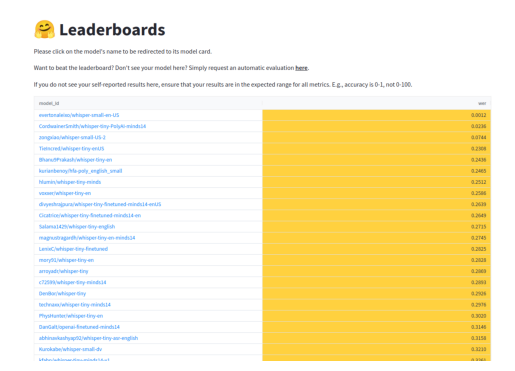

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

pic = mpimg.imread('images/5.13.png')
pic.shape
plt.imshow(pic)
plt.axis('off') 
plt.show()

## 补充阅读和资源

本单元提供了语音识别的实践介绍，这是音频领域最流行的任务之一。想了解更多吗？在这里您将找到更多资源，帮助您加深对主题的理解并增强您的学习体验。

Jong Wook Kim 的Whisper Talk：关于 Whisper 模型的演示，解释了动机、架构、训练和结果，由 Whisper 作者 Jong Wook Kim 发表

端到端语音基准 (ESB)：一篇全面论证使用正交 WER 而不是标准化 WER 来评估 ASR 系统的论文，并提出了一个随附的基准

Fine-Tuning Whisper for Multilingual ASR：一篇深入的博客文章，更详细地解释了 Whisper 模型的工作原理，以及与特征提取器和分词器相关的预处理和后处理步骤

Fine-tuning MMS Adapter Models for Multi-Lingual ASR：用于微调 Meta AI 的新MMS语音识别模型、冻结基本模型权重并仅微调少量适配器层的端到端指南

Boosting Wav2Vec2 with n-grams in 🤗 Transformers：一篇将 CTC 模型与外部语言模型 (LM) 相结合以消除拼写和标点错误的博客文章